In [1]:
%load_ext autoreload
%autoreload 2

import os 
import shutil
import numpy as n
from datetime import date
from matplotlib import pyplot as plt
import time
import napari

In [2]:
os.chdir('/home/ali/packages/s2p-lbm/')

from suite3d.job import Job
from suite3d import lbmio, utils, ui
from suite3d import tiff_utils as tfu
from suite3d import file_utils as flu

In [65]:
subjects_dir =   '/mnt/zortex-subjects/'
expt_info = { 
    'subject':         'CR028',
    'date' :          '2024-08-09',
    'expnum' :         [1],}

tifs, si_params, exp_str = flu.find_exp(subjects_dir, **expt_info, verbose=False)

job_params = {    
    # number of channels recorded in the tiff file, typically 30
    'n_ch_tif' : 26,
    # number of planes in the deeper cavity, typically 15
    'cavity_size' : 13,
    # convert from the Scanimage channel ordering to deep-to-shallow ordering
    # in our case, ScanImage channel numbers are in temporal order. 
    'planes' : n.array([ 0,  2,  4,  6,  8, 10, 12, 14,
                        16, 18, 20, 22]),
    # number of files to use for the initial pass
    'n_init_files' :   4,
    
    # number of pixels to fuse between the ROI strips
    # the auto-detection doesn't always work well, recommend 
    # manually tuning it to reduce the stitching artifacts
    'fuse_shift_override' : 2,
    
    # will try to automatically estimate crosstalk using 
    # the shallowest crosstalk_n_planes planes. if you want to override,
    # set override_crosstalk = float between 0 and 1
    'subtract_crosstalk' : False,
    
    # volume rate in acquisition
    'fs' : flu.get_si_params(tifs[0])['vol_rate'],
    
    # 3D GPU registration - fast! 
    # for now, 3D + GPU are well-tested, other options might have minor bugs
    # if you run into them, let us know! we'll fix them
    '3d_reg' : True,
    'use_GPU_registration' : True,
}

In [66]:

job_params['fs'] = si_params['vol_rate']

savedir = os.path.join('/mnt/md0/runs', expt_info['subject'], expt_info['date'])
os.makedirs(savedir, exist_ok=True)

In [67]:
# Create the job
job = Job('/mnt/md0/runs',exp_str, tifs = tifs,
          params=job_params, create=True, overwrite=True, verbosity = 3)

Job directory /mnt/md0/runs/s3d-CR028_2024-08-09_1 already exists
Loading job directory for CR028_2024-08-09_1 in /mnt/md0/runs
   Loading dirs 
      Found dir registered_fused_data
      Found dir summary
      Found dir iters
   Loading default params
      Updating param n_ch_tif
      Updating param cavity_size
      Updating param planes
      Updating param n_init_files
      Updating param fuse_shift_override
      Updating param subtract_crosstalk
      Updating param fs
      Updating param 3d_reg
      Updating param use_GPU_registration
   Updated main params file


In [68]:
# optional parameters for initialization
# load 1 file to initialize, and select 200 frames randomly to do initalization on
job.params['n_init_files'] = 4
job.params['init_n_frames'] = None
job.params['init_file_sample_method'] = 'even'
job.params['voxel_size_um'] = (20, 3.3, 3.3)

   Saved a copy of params at /mnt/md0/runs/s3d-CR028_2024-08-09_1/summary
   Updated main params file
Launching initial pass
Saving summary to /mnt/md0/runs/s3d-CR028_2024-08-09_1/summary/summary.npy
   Loading init tifs with 26 channels
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00007.tif
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00014.tif
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00020.tif
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00027.tif
   Loaded 4 files, total 3.22 GB
   Loaded movie with 400 frames and shape 12, 500, 720
      Enforcing positivity in mean image
   No crosstalk estimation or subtraction
   Using 3d registration
   Computing plane alignment shifts
   Applying plane alignment shifts
(12, 400, 522, 745)
(12, 2)
[[  0   0]
 [  2  -3]
 [  4  -6]
 [  6  -9]
 [  8 -12]
 [ 10 -15]
 [ 12 -18]
 [ 14 -21]
 [ 16 -

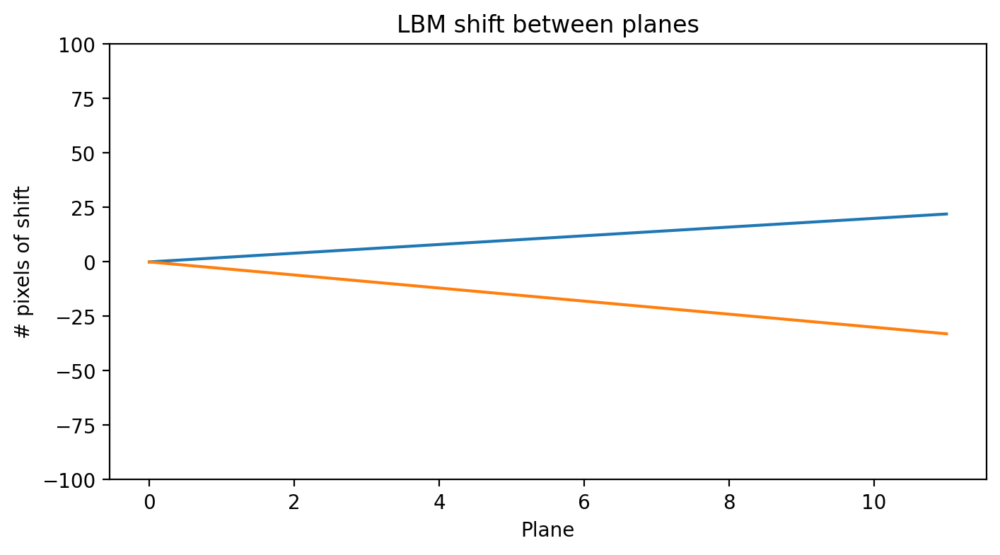

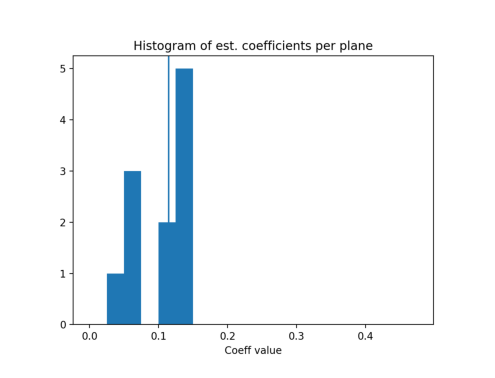

In [69]:
%%time
summary = job.run_init_pass()

In [70]:
summary = job.load_summary()

In [85]:
%%time
job.register_gpu()

      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/registered_fused_data
      Updating self.dirs tag registered_fused_data
   Overriding fuse shift value to 2
   Not clipping frames for registration
Will analyze 33 tifs in 33 batches
   Enforcing positivity
   Launching IO thread
         Memory at batch 0.  Total Used: 229.571 GB, Virtual Available: 289.309 GB, Virtual Used: 213.885 GB, Swap Used: 015.686 GB
Loading Batch 0 of 32
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00001.tif


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 0 IO thread joined
         Memory after IO thread joinTotal Used: 230.671 GB, Virtual Available: 288.209 GB, Virtual Used: 214.986 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 231.475 GB, Virtual Available: 287.405 GB, Virtual Used: 215.790 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 220.236 GB, Virtual Available: 298.645 GB, Virtual Used: 204.550 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00002.tif
         After IO thread launch:Total Used: 220.236 GB, Virtual Available: 298.645 GB, Virtual Used: 204.550 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.05 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 1 IO thread joined
         Memory after IO thread joinTotal Used: 223.922 GB, Virtual Available: 294.959 GB, Virtual Used: 208.236 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.923 GB, Virtual Available: 294.957 GB, Virtual Used: 208.238 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.123 GB, Virtual Available: 295.758 GB, Virtual Used: 207.437 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.123 GB, Virtual Available: 295.758 GB, Virtual Used: 207.437 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00003.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 2 IO thread joined
         Memory after IO thread joinTotal Used: 223.952 GB, Virtual Available: 294.929 GB, Virtual Used: 208.266 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.959 GB, Virtual Available: 294.922 GB, Virtual Used: 208.273 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.145 GB, Virtual Available: 295.736 GB, Virtual Used: 207.459 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.145 GB, Virtual Available: 295.736 GB, Virtual Used: 207.459 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00004.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 3 IO thread joined
         Memory after IO thread joinTotal Used: 223.948 GB, Virtual Available: 294.933 GB, Virtual Used: 208.262 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.952 GB, Virtual Available: 294.928 GB, Virtual Used: 208.267 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.144 GB, Virtual Available: 295.736 GB, Virtual Used: 207.459 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.144 GB, Virtual Available: 295.736 GB, Virtual Used: 207.459 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00005.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 4 IO thread joined
         Memory after IO thread joinTotal Used: 223.985 GB, Virtual Available: 294.895 GB, Virtual Used: 208.300 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.986 GB, Virtual Available: 294.895 GB, Virtual Used: 208.300 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.186 GB, Virtual Available: 295.695 GB, Virtual Used: 207.500 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.186 GB, Virtual Available: 295.695 GB, Virtual Used: 207.500 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00006.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 5 IO thread joined
         Memory after IO thread joinTotal Used: 223.989 GB, Virtual Available: 294.891 GB, Virtual Used: 208.303 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.988 GB, Virtual Available: 294.892 GB, Virtual Used: 208.303 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.188 GB, Virtual Available: 295.693 GB, Virtual Used: 207.502 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.188 GB, Virtual Available: 295.693 GB, Virtual Used: 207.502 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00007.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 6 IO thread joined
         Memory after IO thread joinTotal Used: 224.000 GB, Virtual Available: 294.880 GB, Virtual Used: 208.315 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 224.002 GB, Virtual Available: 294.879 GB, Virtual Used: 208.316 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.195 GB, Virtual Available: 295.685 GB, Virtual Used: 207.510 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.195 GB, Virtual Available: 295.685 GB, Virtual Used: 207.510 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00008.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 7 IO thread joined
         Memory after IO thread joinTotal Used: 224.006 GB, Virtual Available: 294.874 GB, Virtual Used: 208.321 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 224.004 GB, Virtual Available: 294.876 GB, Virtual Used: 208.319 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.204 GB, Virtual Available: 295.677 GB, Virtual Used: 207.518 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.204 GB, Virtual Available: 295.677 GB, Virtual Used: 207.518 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00009.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 8 IO thread joined
         Memory after IO thread joinTotal Used: 223.997 GB, Virtual Available: 294.884 GB, Virtual Used: 208.311 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.997 GB, Virtual Available: 294.883 GB, Virtual Used: 208.312 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.191 GB, Virtual Available: 295.689 GB, Virtual Used: 207.505 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.191 GB, Virtual Available: 295.689 GB, Virtual Used: 207.505 GB, Swap Used: 015.686 GB
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00010.tif
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 9 IO thread joined
         Memory after IO thread joinTotal Used: 224.003 GB, Virtual Available: 294.878 GB, Virtual Used: 208.317 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 224.009 GB, Virtual Available: 294.872 GB, Virtual Used: 208.323 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.199 GB, Virtual Available: 295.681 GB, Virtual Used: 207.514 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.199 GB, Virtual Available: 295.681 GB, Virtual Used: 207.514 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00011.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 10 IO thread joined
         Memory after IO thread joinTotal Used: 223.987 GB, Virtual Available: 294.893 GB, Virtual Used: 208.302 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.991 GB, Virtual Available: 294.889 GB, Virtual Used: 208.306 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.183 GB, Virtual Available: 295.697 GB, Virtual Used: 207.498 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.183 GB, Virtual Available: 295.697 GB, Virtual Used: 207.498 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00012.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 11 IO thread joined
         Memory after IO thread joinTotal Used: 223.979 GB, Virtual Available: 294.901 GB, Virtual Used: 208.294 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.981 GB, Virtual Available: 294.900 GB, Virtual Used: 208.295 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.171 GB, Virtual Available: 295.710 GB, Virtual Used: 207.485 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.171 GB, Virtual Available: 295.710 GB, Virtual Used: 207.485 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00013.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 12 IO thread joined
         Memory after IO thread joinTotal Used: 223.987 GB, Virtual Available: 294.893 GB, Virtual Used: 208.302 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.994 GB, Virtual Available: 294.887 GB, Virtual Used: 208.308 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.179 GB, Virtual Available: 295.701 GB, Virtual Used: 207.494 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.179 GB, Virtual Available: 295.701 GB, Virtual Used: 207.494 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00014.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 13 IO thread joined
         Memory after IO thread joinTotal Used: 223.982 GB, Virtual Available: 294.899 GB, Virtual Used: 208.296 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.979 GB, Virtual Available: 294.901 GB, Virtual Used: 208.294 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.179 GB, Virtual Available: 295.701 GB, Virtual Used: 207.494 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.179 GB, Virtual Available: 295.701 GB, Virtual Used: 207.494 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00015.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 14 IO thread joined
         Memory after IO thread joinTotal Used: 224.017 GB, Virtual Available: 294.863 GB, Virtual Used: 208.332 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 224.065 GB, Virtual Available: 294.816 GB, Virtual Used: 208.379 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.200 GB, Virtual Available: 295.681 GB, Virtual Used: 207.514 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.200 GB, Virtual Available: 295.681 GB, Virtual Used: 207.514 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00016.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 15 IO thread joined
         Memory after IO thread joinTotal Used: 223.996 GB, Virtual Available: 294.885 GB, Virtual Used: 208.310 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 224.002 GB, Virtual Available: 294.878 GB, Virtual Used: 208.317 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.192 GB, Virtual Available: 295.688 GB, Virtual Used: 207.507 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.192 GB, Virtual Available: 295.688 GB, Virtual Used: 207.507 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00017.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 16 IO thread joined
         Memory after IO thread joinTotal Used: 223.996 GB, Virtual Available: 294.885 GB, Virtual Used: 208.310 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.991 GB, Virtual Available: 294.890 GB, Virtual Used: 208.305 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.184 GB, Virtual Available: 295.696 GB, Virtual Used: 207.499 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.184 GB, Virtual Available: 295.696 GB, Virtual Used: 207.499 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00018.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 17 IO thread joined
         Memory after IO thread joinTotal Used: 223.964 GB, Virtual Available: 294.917 GB, Virtual Used: 208.278 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.964 GB, Virtual Available: 294.917 GB, Virtual Used: 208.278 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.163 GB, Virtual Available: 295.717 GB, Virtual Used: 207.478 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.163 GB, Virtual Available: 295.717 GB, Virtual Used: 207.478 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00019.tif
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 18 IO thread joined
         Memory after IO thread joinTotal Used: 223.973 GB, Virtual Available: 294.908 GB, Virtual Used: 208.287 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.977 GB, Virtual Available: 294.903 GB, Virtual Used: 208.292 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.167 GB, Virtual Available: 295.713 GB, Virtual Used: 207.482 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.167 GB, Virtual Available: 295.713 GB, Virtual Used: 207.482 GB, Swap Used: 015.686 GB
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00020.tif
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 19 IO thread joined
         Memory after IO thread joinTotal Used: 223.957 GB, Virtual Available: 294.923 GB, Virtual Used: 208.272 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.961 GB, Virtual Available: 294.919 GB, Virtual Used: 208.276 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.153 GB, Virtual Available: 295.728 GB, Virtual Used: 207.467 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.153 GB, Virtual Available: 295.728 GB, Virtual Used: 207.467 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00021.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 20 IO thread joined
         Memory after IO thread joinTotal Used: 223.966 GB, Virtual Available: 294.915 GB, Virtual Used: 208.280 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.965 GB, Virtual Available: 294.916 GB, Virtual Used: 208.279 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.164 GB, Virtual Available: 295.716 GB, Virtual Used: 207.479 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.164 GB, Virtual Available: 295.716 GB, Virtual Used: 207.479 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00022.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 21 IO thread joined
         Memory after IO thread joinTotal Used: 223.982 GB, Virtual Available: 294.899 GB, Virtual Used: 208.296 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.985 GB, Virtual Available: 294.895 GB, Virtual Used: 208.300 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.175 GB, Virtual Available: 295.705 GB, Virtual Used: 207.490 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.175 GB, Virtual Available: 295.705 GB, Virtual Used: 207.490 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00023.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 22 IO thread joined
         Memory after IO thread joinTotal Used: 223.958 GB, Virtual Available: 294.922 GB, Virtual Used: 208.273 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.960 GB, Virtual Available: 294.920 GB, Virtual Used: 208.275 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.152 GB, Virtual Available: 295.729 GB, Virtual Used: 207.466 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.152 GB, Virtual Available: 295.729 GB, Virtual Used: 207.466 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00024.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 23 IO thread joined
         Memory after IO thread joinTotal Used: 223.966 GB, Virtual Available: 294.915 GB, Virtual Used: 208.280 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.964 GB, Virtual Available: 294.916 GB, Virtual Used: 208.279 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.155 GB, Virtual Available: 295.726 GB, Virtual Used: 207.469 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.155 GB, Virtual Available: 295.726 GB, Virtual Used: 207.469 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00025.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 24 IO thread joined
         Memory after IO thread joinTotal Used: 223.944 GB, Virtual Available: 294.937 GB, Virtual Used: 208.258 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.940 GB, Virtual Available: 294.941 GB, Virtual Used: 208.254 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.140 GB, Virtual Available: 295.741 GB, Virtual Used: 207.454 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.140 GB, Virtual Available: 295.741 GB, Virtual Used: 207.454 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00026.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 25 IO thread joined
         Memory after IO thread joinTotal Used: 223.948 GB, Virtual Available: 294.933 GB, Virtual Used: 208.262 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.950 GB, Virtual Available: 294.930 GB, Virtual Used: 208.265 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.140 GB, Virtual Available: 295.740 GB, Virtual Used: 207.455 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.140 GB, Virtual Available: 295.740 GB, Virtual Used: 207.455 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00027.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 26 IO thread joined
         Memory after IO thread joinTotal Used: 223.942 GB, Virtual Available: 294.939 GB, Virtual Used: 208.256 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.942 GB, Virtual Available: 294.938 GB, Virtual Used: 208.257 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.136 GB, Virtual Available: 295.745 GB, Virtual Used: 207.450 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.136 GB, Virtual Available: 295.745 GB, Virtual Used: 207.450 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00028.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 27 IO thread joined
         Memory after IO thread joinTotal Used: 223.911 GB, Virtual Available: 294.970 GB, Virtual Used: 208.225 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.911 GB, Virtual Available: 294.970 GB, Virtual Used: 208.225 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.110 GB, Virtual Available: 295.770 GB, Virtual Used: 207.425 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.110 GB, Virtual Available: 295.770 GB, Virtual Used: 207.425 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00029.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 28 IO thread joined
         Memory after IO thread joinTotal Used: 223.908 GB, Virtual Available: 294.972 GB, Virtual Used: 208.223 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.911 GB, Virtual Available: 294.970 GB, Virtual Used: 208.225 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.103 GB, Virtual Available: 295.778 GB, Virtual Used: 207.417 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.103 GB, Virtual Available: 295.778 GB, Virtual Used: 207.417 GB, Swap Used: 015.686 GB
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00030.tif
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 29 IO thread joined
         Memory after IO thread joinTotal Used: 223.920 GB, Virtual Available: 294.961 GB, Virtual Used: 208.234 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.921 GB, Virtual Available: 294.960 GB, Virtual Used: 208.235 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.111 GB, Virtual Available: 295.770 GB, Virtual Used: 207.425 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.111 GB, Virtual Available: 295.770 GB, Virtual Used: 207.425 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00031.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 30 IO thread joined
         Memory after IO thread joinTotal Used: 223.934 GB, Virtual Available: 294.947 GB, Virtual Used: 208.248 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.939 GB, Virtual Available: 294.942 GB, Virtual Used: 208.253 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.129 GB, Virtual Available: 295.752 GB, Virtual Used: 207.443 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00032.tif
         After IO thread launch:Total Used: 223.129 GB, Virtual Available: 295.752 GB, Virtual Used: 207.443 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

   Loaded 1 files, total 0.80 GB
   Batch 31 IO thread joined
         Memory after IO thread joinTotal Used: 223.934 GB, Virtual Available: 294.946 GB, Virtual Used: 208.248 GB, Swap Used: 015.686 GB
         Memory after movie copied from threadTotal Used: 223.939 GB, Virtual Available: 294.942 GB, Virtual Used: 208.253 GB, Swap Used: 015.686 GB
         Memory after thread memory clearedTotal Used: 223.129 GB, Virtual Available: 295.752 GB, Virtual Used: 207.443 GB, Swap Used: 015.686 GB
   Launching IO thread for next batch
         After IO thread launch:Total Used: 223.129 GB, Virtual Available: 295.752 GB, Virtual Used: 207.443 GB, Swap Used: 015.686 GB
      Loaded batch of size (12, 100, 500, 720)
         Sending frames 0-10 to GPU for rigid registration
      Loading /mnt/zortex-subjects/CR028/2024-08-09/1/CR028_2024-08-09_1_001_00001_00033.tif
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid regist

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

         Non rigid transformed (on CPU) in 2.40 sec
         After GPU Batch:    Total Used: 231.099 GB, Virtual Available: 287.782 GB, Virtual Used: 215.413 GB, Swap Used: 015.686 GB
         Sending frames 60-70 to GPU for rigid registration
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registration in 0.20 sec
         Computed non-rigid shifts in 0.34 sec
         Transferred shifted mov of shape (10, 12, 522, 745) to CPU in 0.00 sec
         Non rigid transformed (on CPU) in 0.35 sec
         After GPU Batch:    Total Used: 225.014 GB, Virtual Available: 293.867 GB, Virtual Used: 209.328 GB, Swap Used: 015.686 GB
         Sending frames 70-80 to GPU for rigid registration
   Loaded 1 files, total 0.38 GB
         Registered batch in 0.01 sec
         Shifted batch in 0.04 sec
         Freeing all blocks
         Completed rigid registration in 0.14 sec
         Computed non-rigid shifts in 0.28 sec
   

In [113]:
mov = job.get_registered_movie()

In [118]:
im = mov.mean(axis=1).compute()

In [120]:
mov.shape

(12, 3247, 522, 745)

In [122]:
exmov = mov[5,:800].compute()

In [127]:
n.save('/mnt/zeytin-f1/s3d-results/exmov.npy', exmov)

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

In [123]:
def save_vid(mov, vol_rate, save_dir, filename_start,
            speed = 2, max_percentile = 99.5, avg_window = 1, use_ffmpeg=False, ext='.mp4', fourcc_codec='mjpg'): # old codec: mp4v
    vid_name = '%s-speed%02dx-avg%02dframe-white%s-codec_%s' % (filename_start, speed, avg_window, str(max_percentile).replace('.','p'), fourcc_codec)
    vid_name += ext


    white_val = 2**8-1
    n_t, n_y, n_x = mov.shape
    mov_ch = utils.moving_average(mov,axis=0,width=avg_window)

    mov_ch -= mov_ch.min()
    max_val = n.percentile(mov_ch.flatten(), max_percentile)
    mov_ch = mov_ch * (white_val/max_val)
    mov_ch[mov_ch > white_val] = white_val
    mov_ch = mov_ch.astype(int)

    vid_path = os.path.join(save_dir, vid_name)
    fps = vol_rate * speed

    if use_ffmpeg:
        outputfile = vid_path
        # print(outputfile)
        skvideo.setFFmpegPath(ffmpeg_path)
        # print(skvideo._FFMPEG_PATH)
        # print(skvideo._FFMPEG_SUPPORTED_ENCODERS)
        writer = FFmpegWriter(outputfile, verbosity=3,
            inputdict={'-r':str(int(n.round(fps)))},
            outputdict={
            '-vcodec': 'libx264',  #use the h.264 codec
            '-crf': '0',           #set the constant rate factor to 0, which is lossless
            '-r':str(int(n.round(fps))),
            '-preset':'slower' ,  #the slower the better compression, in princple, try 
                                    #other options see https://trac.ffmpeg.org/wiki/Encode/H.264
            }) 
        for i in range(n_t):
            frame = n.stack([mov_ch[i]]*3, axis=-1).astype(n.uint8)
            writer.writeFrame(frame)  #write the frame as RGB not BGR

        writer.close() #close the writer
    else:        
        codec = cv2.VideoWriter_fourcc(*fourcc_codec)
        out = cv2.VideoWriter(vid_path, codec, fps, (n_x, n_y), False)
        for i in range(n_t):
            out.write(n.uint8(mov_ch[i]))
        out.release()

    return vid_path

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fe2c4ef2970>)

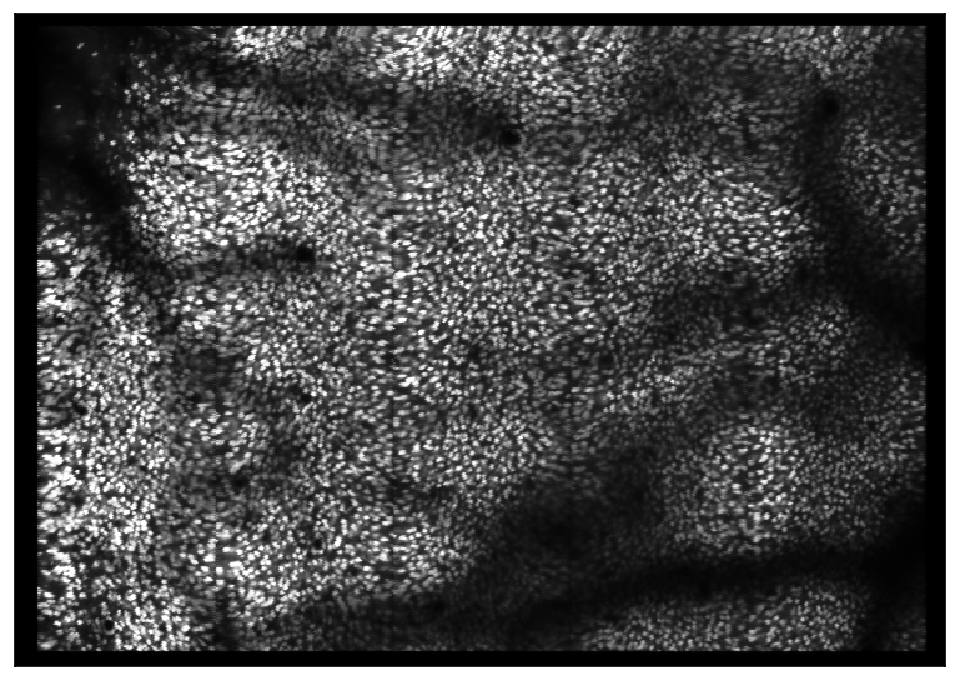

In [119]:
tfu.show_tif(im[5])

In [86]:
job.params['voxel_size_um'] = (20, 3.33, 3.33)
job.params['npil_filt_xy_um'] = 100
job.params['cell_filt_xy_um'] = 15
job.params['sdnorm_exp'] = 0.80

params_to_sweep = {
    'npil_filt_xy_um' : (100, 500),
    'cell_filt_xy_um' : (15, 20, 25,30),
    # 'sdnorm_exp' : (0.8, 0.9),
}
job.sweep_corrmap(params_to_sweep, iter_limit=2)

   Setting up sweep
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap
      Updating self.dirs tag sweeps-corrmap
   Total of 8 combinations
      Created directory for comb_00000 with params comb00000-params-npil_filt_xy_um_100.000-cell_filt_xy_um_15.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap/comb_00000
      Updating self.dirs tag sweeps-corrmap-comb_00000
      Created directory for comb_00001 with params comb00001-params-npil_filt_xy_um_100.000-cell_filt_xy_um_20.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap/comb_00001
      Updating self.dirs tag sweeps-corrmap-comb_00001
      Created directory for comb_00002 with params comb00002-params-npil_filt_xy_um_100.000-cell_filt_xy_um_25.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap/comb_00002
      Updating self.dirs tag sweeps-corrmap-comb_00002
      Created directory for comb_00003 with params comb00003-params-npil_filt_xy_um_100.000-ce

{'sweep_dir_path': '/mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap',
 'sweep_dir_name': 'sweeps-corrmap',
 'init_params': {'fs': 8.381881533101046,
  'tau': 1.3,
  'voxel_size_um': (20, 3.33, 3.33),
  'planes': array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22]),
  'convert_plane_ids_to_channel_ids': False,
  'n_ch_tif': 26,
  'notch_filt': None,
  'fix_fastZ': False,
  'n_init_files': 4,
  'init_file_pool': None,
  'init_file_sample_method': 'even',
  'init_n_frames': None,
  'enforce_positivity': True,
  'fix_shallow_plane_shift_estimates': True,
  'fix_shallow_plane_shift_esimate_threshold': 20,
  'overwrite_plane_shifts': None,
  'subtract_crosstalk': False,
  'override_crosstalk': None,
  'crosstalk_percentile': 99.5,
  'crosstalk_sigma': 0.01,
  'cavity_size': 13,
  'crosstalk_n_planes': 2,
  'use_GPU_registration': True,
  'fuse_strips': True,
  'fuse_shift_override': 2,
  'max_rigid_shift_pix': 100,
  'plane_to_plane_alignment': True,
  'gpu_reg_batchsize': 10,
  'max_

In [88]:
job.params['voxel_size_um'] = (20,2.5, 2.5)
job.params['npil_filt_xy_um'] = 200
job.params['cell_filt_xy_um'] = 10
job.params['sdnorm_exp'] = 1.0

params_to_sweep = {
    # 'npil_filt_xy_um' : (100, 500),
    'cell_filt_xy_um' : (5, 10, 15, 20, 30),
    # 'sdnorm_exp' : (0.8, 0.9, 1.0),
}
job.sweep_corrmap(params_to_sweep, iter_limit=1,sweep_name='corrmap2')

   Setting up sweep
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2
      Updating self.dirs tag sweeps-corrmap2
   Total of 5 combinations
      Created directory for comb_00000 with params comb00000-params-cell_filt_xy_um_5.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2/comb_00000
      Updating self.dirs tag sweeps-corrmap2-comb_00000
      Created directory for comb_00001 with params comb00001-params-cell_filt_xy_um_10.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2/comb_00001
      Updating self.dirs tag sweeps-corrmap2-comb_00001
      Created directory for comb_00002 with params comb00002-params-cell_filt_xy_um_15.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2/comb_00002
      Updating self.dirs tag sweeps-corrmap2-comb_00002
      Created directory for comb_00003 with params comb00003-params-cell_filt_xy_um_20.000
   Created dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2/

{'sweep_dir_path': '/mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/corrmap2',
 'sweep_dir_name': 'sweeps-corrmap2',
 'init_params': {'fs': 8.381881533101046,
  'tau': 1.3,
  'voxel_size_um': (20, 2.5, 2.5),
  'planes': array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22]),
  'convert_plane_ids_to_channel_ids': False,
  'n_ch_tif': 26,
  'notch_filt': None,
  'fix_fastZ': False,
  'n_init_files': 4,
  'init_file_pool': None,
  'init_file_sample_method': 'even',
  'init_n_frames': None,
  'enforce_positivity': True,
  'fix_shallow_plane_shift_estimates': True,
  'fix_shallow_plane_shift_esimate_threshold': 20,
  'overwrite_plane_shifts': None,
  'subtract_crosstalk': False,
  'override_crosstalk': None,
  'crosstalk_percentile': 99.5,
  'crosstalk_sigma': 0.01,
  'cavity_size': 13,
  'crosstalk_n_planes': 2,
  'use_GPU_registration': True,
  'fuse_strips': True,
  'fuse_shift_override': 2,
  'max_rigid_shift_pix': 100,
  'plane_to_plane_alignment': True,
  'gpu_reg_batchsize': 10,
  'max_

In [95]:
%%time
job.params['voxel_size_um'] = (20,2.5, 2.5)
job.params['npil_filt_xy_um'] = 200
job.params['cell_filt_xy_um'] = 15
job.params['sdnorm_exp'] = 0.85

corr_map = job.calculate_corr_map()

      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/corrmap
      Updating self.dirs tag corrmap
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/mov_sub
      Updating self.dirs tag mov_sub
   Saved a copy of params at /mnt/md0/runs/s3d-CR028_2024-08-09_1/corrmap
   Updated main params file
   Computing correlation map of movie with 3247 frames, volume shape: 12, 522, 745
      Running batch 1 of 17
         Loading movie into shared memory
         Subtracting neuropil and applying cell filters
         Reducing filtered movie to compute correlation map
      Running batch 2 of 17
         Loading movie into shared memory
         Subtracting neuropil and applying cell filters
         Reducing filtered movie to compute correlation map
      Running batch 3 of 17
         Loading movie into shared memory
         Subtracting neuropil and applying cell filters
         Reducing filtered movie to compute correlation map
      Running batch 4 of 17
         Loading movie into share

In [98]:
res = job.load_corr_map_results()
vmap = res['vmap']

In [102]:
job.params['activity_thresh']

20.0

In [106]:

job.params['peak_thresh'] = 2.4
job.params['percentile'] = 99.0
job.params['extend_thresh'] = 0.2
job.params['max_pix'] = 100
params_to_sweep = {
    'extend_thresh' : (0.05, 0.1,0.2),
    'percentile'   : (90.0, 95.0, 99.0, 99.5, 99.9),
    'activity_thresh' : (5.0, 10.0, 20.0)
 }
job.sweep_segmentation(params_to_sweep, all_combinations=True, 
                       patches_to_segment=[20, 40],ts=(0,2600));

   Setting up sweep
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg
      Updating self.dirs tag sweeps-seg
   Total of 45 combinations
      Created directory for comb_00000 with params comb00000-params-extend_thresh_0.050-percentile_90.000-activity_thresh_5.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg/comb_00000
      Updating self.dirs tag sweeps-seg-comb_00000
      Created directory for comb_00001 with params comb00001-params-extend_thresh_0.050-percentile_90.000-activity_thresh_10.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg/comb_00001
      Updating self.dirs tag sweeps-seg-comb_00001
      Created directory for comb_00002 with params comb00002-params-extend_thresh_0.050-percentile_90.000-activity_thresh_20.000
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg/comb_00002
      Updating self.dirs tag sweeps-seg-comb_00002
      Created directory for comb_00003 with params comb00003-params-extend_thresh_0.

In [107]:

job.params['peak_thresh'] = 2.4
job.params['percentile'] = 95.0
job.params['extend_thresh'] = 0.1
job.params['activity_thresh'] = 5.0
job.params['max_pix'] = 100
job.params['detection_timebin'] = 1 
params_to_sweep = {
    'detection_timebin' : (1,2,4,8),
 }
job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',
                       patches_to_segment=[20, 40],ts=(0,2600));

   Setting up sweep
   Created dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg2 with tag sweeps-seg2
      Updating self.dirs tag sweeps-seg2
   Total of 4 combinations
      Created directory for comb_00000 with params comb00000-params-detection_timebin_1.000
   Created dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg2/comb_00000 with tag sweeps-seg2-comb_00000
      Updating self.dirs tag sweeps-seg2-comb_00000
      Created directory for comb_00001 with params comb00001-params-detection_timebin_2.000
   Created dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg2/comb_00001 with tag sweeps-seg2-comb_00001
      Updating self.dirs tag sweeps-seg2-comb_00001
      Created directory for comb_00002 with params comb00002-params-detection_timebin_4.000
   Created dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/sweeps/seg2/comb_00002 with tag sweeps-seg2-comb_00002
      Updating self.dirs tag sweeps-seg2-comb_00002
      Created directory for comb_00003 with params comb00003-params-detect

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 05, 234, 440, peak: 4.645, thresh: 5.000, 168 frames, 145 pixels
         Added cell 2 at 08, 182, 432, peak: 4.204, thresh: 5.000, 145 frames, 178 pixels
         Added cell 3 at 08, 246, 445, peak: 4.023, thresh: 5.000, 134 frames, 196 pixels
         Added cell 4 at 00, 187, 383, peak: 3.999, thresh: 5.000, 303 frames, 37 pixels
         Added cell 5 at 07, 245, 412, peak: 3.977, thresh: 5.000, 125 frames, 182 pixels
         Added cell 6 at 06, 184, 437, peak: 3.812, thresh: 5.000, 160 frames, 147 pixels
         Added cell 7 at 04, 255, 453, peak: 3.763, thresh: 5.000, 124 frames, 159 pixels
         Added cell 8 at 03, 242, 449, peak: 3.614, thresh: 4.861, 121 frames, 138 pixels
         Added cell 9 at 00, 209, 394, peak: 3.575, thresh: 5.000, 353 frames, 45 pixels
 

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 02, 443, 055, peak: 5.706, thresh: 5.000, 356 frames, 173 pixels
         Added cell 2 at 04, 442, 055, peak: 4.652, thresh: 5.000, 354 frames, 165 pixels
         Added cell 3 at 04, 467, 045, peak: 4.451, thresh: 5.000, 202 frames, 231 pixels
         Added cell 4 at 06, 451, 029, peak: 4.094, thresh: 5.000, 101 frames, 191 pixels
         Added cell 5 at 05, 484, 042, peak: 4.046, thresh: 5.000, 298 frames, 134 pixels
         Added cell 6 at 06, 477, 098, peak: 3.667, thresh: 4.876, 102 frames, 171 pixels
         Added cell 7 at 03, 476, 078, peak: 3.551, thresh: 5.000, 140 frames, 152 pixels
         Added cell 8 at 06, 480, 103, peak: 3.507, thresh: 5.000, 125 frames, 171 pixels
         Added cell 9 at 04, 426, 054, peak: 3.455, thresh: 5.000, 132 frames, 154 pixels

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 05, 234, 440, peak: 4.645, thresh: 5.000, 81 frames, 137 pixels
         Added cell 2 at 08, 182, 432, peak: 4.204, thresh: 4.631, 64 frames, 179 pixels
         Added cell 3 at 08, 246, 445, peak: 4.023, thresh: 4.804, 66 frames, 197 pixels
         Added cell 4 at 00, 187, 383, peak: 3.999, thresh: 5.000, 146 frames, 36 pixels
         Added cell 5 at 07, 245, 412, peak: 3.977, thresh: 4.856, 57 frames, 196 pixels
         Added cell 6 at 06, 184, 437, peak: 3.812, thresh: 5.000, 67 frames, 154 pixels
         Added cell 7 at 04, 255, 453, peak: 3.763, thresh: 3.809, 66 frames, 165 pixels
         Added cell 8 at 03, 242, 449, peak: 3.614, thresh: 3.933, 67 frames, 132 pixels
         Added cell 9 at 00, 209, 394, peak: 3.575, thresh: 5.000, 167 frames, 45 pixels
        

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 02, 443, 055, peak: 5.706, thresh: 5.000, 188 frames, 182 pixels
         Added cell 2 at 04, 442, 055, peak: 4.652, thresh: 5.000, 188 frames, 169 pixels
         Added cell 3 at 04, 467, 045, peak: 4.451, thresh: 5.000, 88 frames, 225 pixels
         Added cell 4 at 06, 451, 029, peak: 4.094, thresh: 4.269, 50 frames, 181 pixels
         Added cell 5 at 05, 484, 042, peak: 4.046, thresh: 5.000, 141 frames, 124 pixels
         Added cell 6 at 06, 477, 098, peak: 3.667, thresh: 4.016, 52 frames, 172 pixels
         Added cell 7 at 03, 476, 078, peak: 3.551, thresh: 4.839, 65 frames, 143 pixels
         Added cell 8 at 06, 480, 103, peak: 3.507, thresh: 4.832, 57 frames, 179 pixels
         Added cell 9 at 04, 426, 054, peak: 3.455, thresh: 5.000, 62 frames, 155 pixels
     

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 05, 234, 440, peak: 4.645, thresh: 5.000, 40 frames, 157 pixels
         Added cell 2 at 08, 182, 432, peak: 4.204, thresh: 3.424, 45 frames, 184 pixels
         Added cell 3 at 08, 246, 445, peak: 4.023, thresh: 4.174, 39 frames, 180 pixels
         Added cell 4 at 00, 187, 383, peak: 3.999, thresh: 5.000, 55 frames, 35 pixels
         Added cell 5 at 07, 245, 412, peak: 3.977, thresh: 3.941, 33 frames, 199 pixels
         Added cell 6 at 06, 184, 437, peak: 3.812, thresh: 4.005, 47 frames, 147 pixels
         Added cell 7 at 04, 255, 453, peak: 3.763, thresh: 3.121, 41 frames, 168 pixels
         Added cell 8 at 03, 242, 449, peak: 3.614, thresh: 3.062, 38 frames, 151 pixels
         Added cell 9 at 00, 209, 394, peak: 3.575, thresh: 5.000, 71 frames, 47 pixels
         A

/tmp/ipykernel_1639038/391559239.py:10: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  job.sweep_segmentation(params_to_sweep, all_combinations=True, sweep_name = 'seg2',


         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 02, 443, 055, peak: 5.706, thresh: 5.000, 91 frames, 184 pixels
         Added cell 2 at 04, 442, 055, peak: 4.652, thresh: 5.000, 91 frames, 174 pixels
         Added cell 3 at 04, 467, 045, peak: 4.451, thresh: 5.000, 47 frames, 221 pixels
         Added cell 4 at 06, 451, 029, peak: 4.094, thresh: 3.861, 30 frames, 185 pixels
         Added cell 5 at 05, 484, 042, peak: 4.046, thresh: 5.000, 68 frames, 148 pixels
         Added cell 6 at 06, 477, 098, peak: 3.667, thresh: 3.494, 32 frames, 184 pixels
         Added cell 7 at 03, 476, 078, peak: 3.551, thresh: 4.639, 32 frames, 137 pixels
         Added cell 8 at 06, 480, 103, peak: 3.507, thresh: 4.534, 32 frames, 186 pixels
         Added cell 9 at 04, 426, 054, peak: 3.455, thresh: 4.322, 35 frames, 163 pixels
        

In [108]:

job.params['peak_thresh'] = 2.4
job.params['percentile'] = 95.0
job.params['extend_thresh'] = 0.1
job.params['activity_thresh'] = 5.0
job.params['max_pix'] = 100
job.params['detection_timebin'] = 1 


job.segment_rois()

      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/segmentation
      Updating self.dirs tag segmentation
   Saved a copy of params at /mnt/md0/runs/s3d-CR028_2024-08-09_1/segmentation
   Updated main params file
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois
      Updating self.dirs tag rois
   Saving results to /mnt/md0/runs/s3d-CR028_2024-08-09_1/segmentation and /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois 
dict_keys(['max_img', 'mean_img', 'vmap', 'all_params'])
   Detecting from patch 1 / 48
      Found dir /mnt/md0/runs/s3d-CR028_2024-08-09_1/segmentation/patch-0000
         Loading 2.09 GB movie to memory, shape: (3247, 12, 120, 120) 
         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 2.400 and Th2: 5.000
         Iter 0000: running 16 ROIs in parallel
         Added cell 1 at 00, 092, 082, peak: 3.902, thresh: 5.000, 544 frames, 75 pixels
         Added cell 2 at 03, 051, 074, peak: 3.692, thresh:

'/mnt/md0/runs/s3d-CR028_2024-08-09_1/rois'

In [111]:
job.compute_npil_masks(stats_dir = job.dirs['rois'])

traces = job.extract_and_deconvolve(stats_dir=job.dirs['rois'])

   Updated main params file
   Movie shape: (12, 3247, 522, 745)
24110
   Extracting 24110 valid cells, and saving cell flags to /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/iscell_extracted.npy
   Extracting activity
Will extract in 7 batches of 500
Saving intermediate results to /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois
Extracting batch 0000 of 0007
Batch size: 8 GB
Extracting batch 0001 of 0007
Batch size: 8 GB
Extracting batch 0002 of 0007
Batch size: 8 GB
Extracting batch 0003 of 0007
Batch size: 8 GB
Extracting batch 0004 of 0007
Batch size: 8 GB
Extracting batch 0005 of 0007
Batch size: 8 GB
Extracting batch 0006 of 0007
Batch size: 4 GB
   Deconvolving
   Saving to /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois


In [112]:
job.export_results('/mnt/zeytin-f1/s3d-results/',result_dir_name='rois')

   Created dir /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1 to export results
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/stats_small.npy
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/info.npy
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/F.npy
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/spks.npy
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/Fneu.npy
      Loading from /mnt/md0/runs/s3d-CR028_2024-08-09_1/rois/iscell.npy
      Overwriting existing /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1/s3d-params.npy
      Overwriting existing /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1/frames.npy
      Overwriting existing /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1/stats.npy
      Saved stats.npy to /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1
      Overwriting existing /mnt/zeytin-f1/s3d-results/s3d-results-CR028_2024-08-09_1/info.npy
      Saved inf